<font size=6><b> 월간 데이콘 항공편 지연 예측 AI 경진대회
* ref: https://dacon.io/competitions/official/236094/overview/description

* 1,000,000개의 데이터
* ID : 샘플 고유 id
* 항공편 운항 관련 정보
    * Month: 해당 항공편의 출발 월
    * Day_of_Month: Month에 해당하는 월의 날짜
    * Estimated_Departure_Time: 전산 시스템을 바탕으로 측정된 비행기의 출발 시간 (현지 시각, HH:MM 형식)
    * Estimated_Arrival_Time: 전산 시스템을 바탕으로 측정된 비행기의 도착 시간 (현지 시각, HH:MM 형식)
    * Cancelled: 해당 항공편의 취소 여부 (0: 취소되지 않음, 1: 취소됨)
    * Diverted: 해당 항공편의 경유 여부 (0: 취소되지 않음, 1: 취소됨)
    * Origin_Airport: 해당 항공편 출발 공항의 고유 코드 (IATA 공항 코드)
    * Origin_Airport_ID: 해당 항공편 출발 공항의 고유 ID (US DOT ID)
    * Origin_State: 해당 항공편 출발 공항이 위치한 주의 이름
    * Destination_Airport: 해당 항공편 도착 공항의 고유 코드 (IATA 공항 코드)
    * Destination_Airport_ID: 해당 항공편 도착 공항의 고유 ID (US DOT ID)
    * Destination_State: 해당 항공편 도착 공항이 위치한 주의 이름
    * Distance: 출발 공항과 도착 공항 사이의 거리 (mile 단위)
    * Airline: 해당 항공편을 운항하는 항공사
    * Carrier_Code(IATA): 해당 항공편을 운항하는 항공사의 고유 코드 
    * (IATA 공항 코드, 단 다른 항공사가 같은 코드를 보유할 수도 있음)
    * Carrier_ID(DOT): 해당 항공편을 운항하는 항공사의 고유 ID (US DOT ID)
    * Tail_Number: 해당 항공편을 운항하는 항공기의 고유 등록번호
* Delay: 항공편 지연 여부 (Not_Delayed, Delayed)
    * 예측해야 하는 타깃
    * 다수의 데이터에 레이블이 존재하지 않음
    * 준지도학습을 통해 레이블링 가능


In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings(action='ignore')

sns.set() 
#-------------------- 차트 관련 속성 (한글처리, 그리드) -----------
plt.rcParams['font.family']= 'Malgun Gothic'  # 한글 처리
plt.rcParams['axes.unicode_minus'] = False  # -, $ 등등에 표현 특수기호로 버리지 말고 다 써줘라.

In [31]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

In [109]:
train = pd.read_csv('./datasets/train3.csv')
test = pd.read_csv('./datasets/test3.csv')
train.head()

,ID,Month,Day_of_Month,Estimated_Departure_Time,Estimated_Arrival_Time,Origin_Airport,Origin_Airport_ID,Origin_State,Destination_Airport,Destination_Airport_ID,Destination_State,Distance,Airline,Carrier_Code(IATA),Carrier_ID(DOT),Tail_Number,Delay
0,TRAIN_000000,4,15,1479.7,1699.26,OKC,13851,Oklahoma,HOU,12191,Texas,419.0,Southwest Airlines Co.,WN,19393,N7858A,NaN
1,TRAIN_000001,8,15,740.0,1024.00,ORD,13930,Illinois,SLC,14869,Utah,1250.0,SkyWest Airlines Inc.,UA,20304,N125SY,NaN
2,TRAIN_000002,9,6,1610.0,1805.00,CLT,11057,North Carolina,LGA,12953,New York,544.0,American Airlines Inc.,AA,19805,N103US,NaN
3,TRAIN_000003,7,10,905.0,1735.00,LAX,12892,California,EWR,11618,New Jersey,2454.0,United Air Lines Inc.,UA,19977,N595UA,NaN
4,TRAIN_000004,1,11,900.0,1019.00,SFO,14771,California,ACV,10157,California,250.0,SkyWest Airlines Inc.,UA,20304,N161SY,NaN


In [3]:
train.columns

Index(['ID', 'Month', 'Day_of_Month', 'Estimated_Departure_Time',
       'Estimated_Arrival_Time', 'Cancelled', 'Diverted', 'Origin_Airport',
       'Origin_Airport_ID', 'Origin_State', 'Destination_Airport',
       'Destination_Airport_ID', 'Destination_State', 'Distance', 'Airline',
       'Carrier_Code(IATA)', 'Carrier_ID(DOT)', 'Tail_Number', 'Delay'],
      dtype='object')

In [117]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 16 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   Month                     1000000 non-null  int64  
 1   Day_of_Month              1000000 non-null  int64  
 2   Estimated_Departure_Time  1000000 non-null  int32  
 3   Estimated_Arrival_Time    1000000 non-null  int32  
 4   Origin_Airport            1000000 non-null  object 
 5   Origin_Airport_ID         1000000 non-null  int64  
 6   Origin_State              1000000 non-null  object 
 7   Destination_Airport       1000000 non-null  object 
 8   Destination_Airport_ID    1000000 non-null  int64  
 9   Destination_State         1000000 non-null  object 
 10  Distance                  1000000 non-null  float64
 11  Airline                   1000000 non-null  object 
 12  Carrier_Code(IATA)        1000000 non-null  object 
 13  Carrier_ID(DOT)           10

In [355]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 18 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   ID                        1000000 non-null  object 
 1   Month                     1000000 non-null  int64  
 2   Day_of_Month              1000000 non-null  int64  
 3   Estimated_Departure_Time  891016 non-null   float64
 4   Estimated_Arrival_Time    890952 non-null   float64
 5   Cancelled                 1000000 non-null  int64  
 6   Diverted                  1000000 non-null  int64  
 7   Origin_Airport            1000000 non-null  object 
 8   Origin_Airport_ID         1000000 non-null  int64  
 9   Origin_State              999972 non-null   object 
 10  Destination_Airport       1000000 non-null  object 
 11  Destination_Airport_ID    1000000 non-null  int64  
 12  Destination_State         999979 non-null   object 
 13  Distance                  10

# EDA

## Drop ID

In [111]:
train = train.drop('ID', axis=1)
test = test.drop('ID', axis=1)

## Diverted

In [17]:
test['Diverted'].value_counts() , test['Diverted'].value_counts()

(0    1000000
 Name: Diverted, dtype: int64,
 0    1000000
 Name: Diverted, dtype: int64)

In [18]:
train = train.drop('Diverted', axis=1)
test = test.drop('Diverted', axis=1)

## Cancelled

In [21]:
test['Cancelled'].value_counts() , test['Cancelled'].value_counts()

(0    1000000
 Name: Cancelled, dtype: int64,
 0    1000000
 Name: Cancelled, dtype: int64)

In [22]:
train = train.drop('Cancelled', axis=1)
test = test.drop('Cancelled', axis=1)

## Target Data (Delay)

In [9]:
train[train['Delay'].notna()].head()

,Month,Day_of_Month,Estimated_Departure_Time,Estimated_Arrival_Time,Cancelled,Diverted,Origin_Airport,Origin_Airport_ID,Origin_State,Destination_Airport,Destination_Airport_ID,Destination_State,Distance,Airline,Carrier_Code(IATA),Carrier_ID(DOT),Tail_Number,Delay
5,4,13,1545.0,NaN,0,0,EWR,11618,NaN,DCA,11278,Virginia,199.0,Republic Airlines,UA,20452.0,N657RW,Not_Delayed
6,1,20,1742.0,1903.0,0,0,EWR,11618,New Jersey,BOS,10721,Massachusetts,200.0,United Air Lines Inc.,UA,NaN,N66825,Not_Delayed
8,6,13,1420.0,1550.0,0,0,BWI,10821,NaN,CLT,11057,North Carolina,361.0,Southwest Airlines Co.,WN,19393.0,N765SW,Not_Delayed
10,8,13,1730.0,1844.0,0,0,DCA,11278,Virginia,PIT,14122,Pennsylvania,204.0,Republic Airlines,AA,NaN,N119HQ,Delayed
12,1,12,1015.0,1145.0,0,0,CLE,11042,Ohio,DEN,11292,Colorado,1201.0,Southwest Airlines Co.,WN,NaN,N8696E,Not_Delayed


In [12]:
train[train['Delay'].notna()].shape[0], train.shape[0], train[train['Delay'].notna()].shape[0]/train.shape[0]

(255001, 1000000, 0.255001)

## Origin_State (결측처리)

In [288]:
nan_idx = train[train['Origin_State'].isna()].index

In [289]:
temp = train[['Origin_Airport_ID', 'Origin_State']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()
temp.head()

,Origin_Airport_ID,Origin_State
0,13851,Oklahoma
1,13930,Illinois
2,11057,North Carolina
3,12892,California
4,14771,California


In [290]:
origin_dic = dict(temp.values)

In [291]:
train.loc[nan_idx, 'Origin_State']

5         NaN
8         NaN
18        NaN
25        NaN
31        NaN
         ... 
999981    NaN
999994    NaN
999995    NaN
999996    NaN
999997    NaN
Name: Origin_State, Length: 109015, dtype: object

In [292]:
train['Origin_State'] = train.apply(lambda x: origin_dic[x['Origin_Airport_ID']] if (pd.isnull(x['Origin_State'])) and (x['Origin_Airport_ID'] in origin_dic.keys()) else x['Origin_State'],  axis=1)
train['Origin_State']

0               Oklahoma
1               Illinois
2         North Carolina
3             California
4             California
               ...      
999995          Illinois
999996      North Dakota
999997        California
999998         Tennessee
999999           Florida
Name: Origin_State, Length: 1000000, dtype: object

In [293]:
train.loc[nan_idx, 'Origin_State']

5            New Jersey
8              Maryland
18        West Virginia
25           California
31               Nevada
              ...      
999981       California
999994            Texas
999995         Illinois
999996     North Dakota
999997       California
Name: Origin_State, Length: 109015, dtype: object

In [294]:
test['Origin_State'] = test.apply(lambda x: origin_dic[x['Origin_Airport_ID']] if (pd.isnull(x['Origin_State'])) and (x['Origin_Airport_ID'] in origin_dic.keys()) else x['Origin_State'],  axis=1)
test['Origin_State']

0              Texas
1         New Jersey
2           Illinois
3         California
4            Florida
             ...    
999995    California
999996      New York
999997      Virginia
999998    California
999999    California
Name: Origin_State, Length: 1000000, dtype: object

In [295]:
train[train['Origin_State'].isna()].shape[0], test[test['Origin_State'].isna()].shape[0]

(0, 28)

In [110]:
# train['Origin_State'] = train['Origin_State'].fillna(train.groupby('Origin_Airport_ID')['Origin_State'].transform(lambda x: x.value_counts().idxmax() if len(x.value_counts())!=0 else np.Nan))
# train[train['Origin_State'].isna()].shape[0]

0

## Destination_State (결측처리)

In [302]:
temp = train[['Destination_Airport_ID', 'Destination_State']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()
temp.head()

,Destination_Airport_ID,Destination_State
0,12191,Texas
1,14869,Utah
2,12953,New York
3,11618,New Jersey
4,10157,California


In [303]:
dest_dic = dict(temp.values)

In [305]:
train['Destination_State'] = train.apply(lambda x: dest_dic[x['Destination_Airport_ID']] if (pd.isnull(x['Destination_State'])) and (x['Destination_Airport_ID'] in dest_dic.keys()) else x['Destination_State'],  axis=1)
train['Destination_State']

0                Texas
1                 Utah
2             New York
3           New Jersey
4           California
              ...     
999995    Pennsylvania
999996       Minnesota
999997           Texas
999998         Georgia
999999        Michigan
Name: Destination_State, Length: 1000000, dtype: object

In [304]:
test['Destination_State'] = test.apply(lambda x: dest_dic[x['Destination_Airport_ID']] if (pd.isnull(x['Destination_State'])) and (x['Destination_Airport_ID'] in dest_dic.keys()) else x['Destination_State'],  axis=1)
test['Destination_State']

0                 Texas
1               Georgia
2              New York
3            California
4            California
              ...      
999995         Colorado
999996         Illinois
999997         Michigan
999998    Massachusetts
999999       California
Name: Destination_State, Length: 1000000, dtype: object

In [313]:
train[train['Destination_State'].isna()].shape[0], test[test['Destination_State'].isna()].shape[0]

(1, 21)

## Airline / Carrier_Code(IATA) / Carrier_ID(DOT) (결측처리)

### Tail_Number -> Airline

In [272]:
train[train['Airline'].isna()].shape[0], test[test['Airline'].isna()].shape[0]

(108920, 106527)

In [342]:
temp = train[['Tail_Number', 'Airline']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()
temp.head()

,Tail_Number,Airline
0,N7858A,Southwest Airlines Co.
1,N125SY,SkyWest Airlines Inc.
2,N103US,American Airlines Inc.
3,N595UA,United Air Lines Inc.
4,N161SY,SkyWest Airlines Inc.


In [343]:
cntdf = temp.groupby('Tail_Number').count()
tail_one = cntdf[cntdf['Airline'] == 1].index
temp = temp.set_index('Tail_Number')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [344]:
train['Airline'] = train.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Airline'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Airline'],  axis=1)
train['Airline'].head()

0    Southwest Airlines Co.
1     SkyWest Airlines Inc.
2    American Airlines Inc.
3     United Air Lines Inc.
4     SkyWest Airlines Inc.
Name: Airline, dtype: object

In [345]:
test['Airline'] = test.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Airline'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Airline'],  axis=1)
test['Airline'].head()

0     United Air Lines Inc.
1      Delta Air Lines Inc.
2     United Air Lines Inc.
3    Southwest Airlines Co.
4           JetBlue Airways
Name: Airline, dtype: object

In [346]:
train[train['Airline'].isna()].shape[0], test[test['Airline'].isna()].shape[0]

(2, 47)

### Tail_Number -> Carrier_Code(IATA)

In [278]:
train[train['Carrier_Code(IATA)'].isna()].shape[0], test[test['Carrier_Code(IATA)'].isna()].shape[0]

(108990, 108993)

In [347]:
temp = train[['Tail_Number', 'Carrier_Code(IATA)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Tail_Number').count()
tail_one = cntdf[cntdf['Carrier_Code(IATA)'] == 1].index
temp = temp.set_index('Tail_Number')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [348]:
train['Carrier_Code(IATA)'] = train.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
train[train['Carrier_Code(IATA)'].isna()].shape[0]

0

In [349]:
test['Carrier_Code(IATA)'] = test.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
test[test['Carrier_Code(IATA)'].isna()].shape[0]

6

### Tail_Number -> Carrier_ID(DOT)

In [282]:
train[train['Carrier_ID(DOT)'].isna()].shape[0], test[test['Carrier_ID(DOT)'].isna()].shape[0]

(108997, 109006)

In [350]:
temp = train[['Tail_Number', 'Carrier_ID(DOT)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Tail_Number').count()
tail_one = cntdf[cntdf['Carrier_ID(DOT)'] == 1].index
temp = temp.set_index('Tail_Number')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [351]:
train['Carrier_ID(DOT)'] = train.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
train[train['Carrier_ID(DOT)'].isna()].shape[0]

2

In [352]:
test['Carrier_ID(DOT)'] = test.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
test[test['Carrier_ID(DOT)'].isna()].shape[0]

47

### Carrier_Code(IATA) -> Airline

### Carrier_ID(DOT) -> Airline

In [309]:
temp = train[['Carrier_ID(DOT)', 'Airline']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Carrier_ID(DOT)').count()
tail_one = cntdf[cntdf['Airline'] == 1].index
temp = temp.set_index('Carrier_ID(DOT)')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [312]:
train['Airline'] = train.apply(lambda x: tail_dic[x['Carrier_ID(DOT)']] if (pd.isnull(x['Airline'])) and (x['Carrier_ID(DOT)'] in tail_dic.keys()) else x['Airline'],  axis=1)
test['Airline'] = test.apply(lambda x: tail_dic[x['Carrier_ID(DOT)']] if (pd.isnull(x['Airline'])) and (x['Carrier_ID(DOT)'] in tail_dic.keys()) else x['Airline'],  axis=1)
train[train['Airline'].isna()].shape[0], test[test['Airline'].isna()].shape[0]

(315, 406)

### Airline -> Carrier_Code(IATA)

In [326]:
temp = train[['Airline', 'Carrier_Code(IATA)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Airline').count()
tail_one = cntdf[cntdf['Carrier_Code(IATA)'] == 1].index
temp = temp.set_index('Airline')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [327]:
train['Carrier_Code(IATA)'] = train.apply(lambda x: tail_dic[x['Airline']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Airline'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
test['Carrier_Code(IATA)'] = test.apply(lambda x: tail_dic[x['Airline']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Airline'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
train[train['Carrier_Code(IATA)'].isna()].shape[0], test[test['Carrier_Code(IATA)'].isna()].shape[0]

(1465, 1463)

### Carrier_ID(DOT) -> Carrier_Code(IATA)

In [324]:
temp = train[['Carrier_ID(DOT)', 'Carrier_Code(IATA)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Carrier_ID(DOT)').count()
tail_one = cntdf[cntdf['Carrier_Code(IATA)'] == 1].index
temp = temp.set_index('Carrier_ID(DOT)')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [325]:
train['Carrier_Code(IATA)'] = train.apply(lambda x: tail_dic[x['Carrier_ID(DOT)']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Carrier_ID(DOT)'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
test['Carrier_Code(IATA)'] = test.apply(lambda x: tail_dic[x['Carrier_ID(DOT)']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Carrier_ID(DOT)'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
train[train['Carrier_Code(IATA)'].isna()].shape[0], test[test['Carrier_Code(IATA)'].isna()].shape[0]

(1465, 1463)

### Airline -> Carrier_ID(DOT)

In [319]:
temp = train[['Airline', 'Carrier_ID(DOT)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Airline').count()
tail_one = cntdf[cntdf['Carrier_ID(DOT)'] == 1].index
temp = temp.set_index('Airline')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [320]:
train['Carrier_ID(DOT)'] = train.apply(lambda x: tail_dic[x['Airline']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Airline'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
test['Carrier_ID(DOT)'] = test.apply(lambda x: tail_dic[x['Airline']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Airline'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
train[train['Carrier_ID(DOT)'].isna()].shape[0], test[test['Carrier_ID(DOT)'].isna()].shape[0]

(315, 406)

### Carrier_Code(IATA) -> Carrier_ID(DOT)

In [322]:
temp = train[['Carrier_Code(IATA)', 'Carrier_ID(DOT)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Carrier_Code(IATA)').count()
tail_one = cntdf[cntdf['Carrier_ID(DOT)'] == 1].index
temp = temp.set_index('Carrier_Code(IATA)')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [323]:
train['Carrier_ID(DOT)'] = train.apply(lambda x: tail_dic[x['Carrier_Code(IATA)']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Carrier_Code(IATA)'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
test['Carrier_ID(DOT)'] = test.apply(lambda x: tail_dic[x['Carrier_Code(IATA)']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Carrier_Code(IATA)'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
train[train['Carrier_ID(DOT)'].isna()].shape[0], test[test['Carrier_ID(DOT)'].isna()].shape[0]

(315, 406)

### 추가 결측

### Tail_Number -> Airline

In [356]:
temp = train[['Tail_Number', 'Airline']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Tail_Number').count()
tail_one = cntdf[cntdf['Airline'] != 1].index
temp = temp.set_index('Tail_Number')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [357]:
train['Airline'] = train.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Airline'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Airline'],  axis=1)
test['Airline'] = test.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Airline'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Airline'],  axis=1)
train[train['Airline'].isna()].shape[0], test[test['Airline'].isna()].shape[0]

(2, 47)

### Tail_Number -> Carrier_Code(IATA)

In [358]:
temp = train[['Tail_Number', 'Carrier_Code(IATA)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Tail_Number').count()
tail_one = cntdf[cntdf['Carrier_Code(IATA)'] != 1].index
temp = temp.set_index('Tail_Number')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [359]:
train['Carrier_Code(IATA)'] = train.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
test['Carrier_Code(IATA)'] = test.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_Code(IATA)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_Code(IATA)'],  axis=1)
train[train['Carrier_Code(IATA)'].isna()].shape[0], test[test['Carrier_Code(IATA)'].isna()].shape[0]


(0, 24)

### Tail_Number -> Carrier_ID(DOT)

In [361]:
temp = train[['Tail_Number', 'Carrier_ID(DOT)']]
temp = temp.dropna(axis=0)
temp = temp.drop_duplicates()

cntdf = temp.groupby('Tail_Number').count()
tail_one = cntdf[cntdf['Carrier_ID(DOT)'] != 1].index
temp = temp.set_index('Tail_Number')
temp = temp.loc[tail_one]
temp = temp.reset_index()
tail_dic = dict(temp.values)

In [362]:
train['Carrier_ID(DOT)'] = train.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
test['Carrier_ID(DOT)'] = test.apply(lambda x: tail_dic[x['Tail_Number']] if (pd.isnull(x['Carrier_ID(DOT)'])) and (x['Tail_Number'] in tail_dic.keys()) else x['Carrier_ID(DOT)'],  axis=1)
train[train['Carrier_ID(DOT)'].isna()].shape[0], test[test['Carrier_ID(DOT)'].isna()].shape[0]


(2, 47)

In [ ]:
# train.to_csv('./datasets/train2.csv', index=False)
# test.to_csv('./datasets/test2.csv', index=False)

In [75]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 24 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   ID                        1000000 non-null  object 
 1   Month                     1000000 non-null  int64  
 2   Day_of_Month              1000000 non-null  int64  
 3   Estimated_Departure_Time  1000000 non-null  int32  
 4   Estimated_Arrival_Time    1000000 non-null  int32  
 5   Origin_Airport            1000000 non-null  object 
 6   Origin_Airport_ID         1000000 non-null  int64  
 7   Origin_State              1000000 non-null  object 
 8   Destination_Airport       1000000 non-null  object 
 9   Destination_Airport_ID    1000000 non-null  int64  
 10  Destination_State         1000000 non-null  object 
 11  Distance                  1000000 non-null  float64
 12  Airline                   1000000 non-null  object 
 13  Carrier_Code(IATA)        10

In [57]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 16 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   ID                        1000000 non-null  object 
 1   Month                     1000000 non-null  int64  
 2   Day_of_Month              1000000 non-null  int64  
 3   Estimated_Departure_Time  1000000 non-null  float64
 4   Estimated_Arrival_Time    1000000 non-null  float64
 5   Origin_Airport            1000000 non-null  object 
 6   Origin_Airport_ID         1000000 non-null  int64  
 7   Origin_State              1000000 non-null  object 
 8   Destination_Airport       1000000 non-null  object 
 9   Destination_Airport_ID    1000000 non-null  int64  
 10  Destination_State         1000000 non-null  object 
 11  Distance                  1000000 non-null  float64
 12  Airline                   1000000 non-null  object 
 13  Carrier_Code(IATA)        10

In [9]:
train['Origin_State'] = train['Origin_State'].fillna(train['Origin_State'].mode()[0])
test['Origin_State'] = test['Origin_State'].fillna(test['Origin_State'].mode()[0])

train['Destination_State'] = train['Destination_State'].fillna(train['Destination_State'].mode()[0])
test['Destination_State'] = test['Destination_State'].fillna(test['Destination_State'].mode()[0])

train['Airline'] = train['Airline'].fillna(train['Airline'].mode()[0])
test['Airline'] = test['Airline'].fillna(test['Airline'].mode()[0])

train['Carrier_Code(IATA)'] = train['Carrier_Code(IATA)'].fillna(train['Carrier_Code(IATA)'].mode()[0])
test['Carrier_Code(IATA)'] = test['Carrier_Code(IATA)'].fillna(test['Carrier_Code(IATA)'].mode()[0])

train['Carrier_ID(DOT)'] = train['Carrier_ID(DOT)'].fillna(train['Carrier_ID(DOT)'].mode()[0])
test['Carrier_ID(DOT)'] = test['Carrier_ID(DOT)'].fillna(test['Carrier_ID(DOT)'].mode()[0])

train['Carrier_ID(DOT)'] = train['Carrier_ID(DOT)'].astype(int)
test['Carrier_ID(DOT)'] = test['Carrier_ID(DOT)'].astype(int)

## Estimated_Departure_Time, Estimated_Arrival_Time (결측처리)

In [37]:
col_list = ['Month', 'Day_of_Month', 'Origin_Airport', 'Destination_Airport', 'Distance', 'Airline', 'Tail_Number']

tdf_train = train[col_list]
tdf_test = test[col_list]

for ohc in ['Origin_Airport', 'Destination_Airport', 'Airline', 'Tail_Number']:
    oh = LabelEncoder()
    oh.fit(tdf_train[ohc])
    oh_data = oh.transform(tdf_train[ohc])
    tdf_train[ohc] = oh_data
    for label in np.unique(tdf_test[ohc]):
        if label not in oh.classes_: # unseen label 데이터인 경우( )
            oh.classes_ = np.append(oh.classes_, label) # 미처리 시 ValueError발생
    oh_data = oh.transform(tdf_test[ohc])
    tdf_test[ohc] = oh_data

In [45]:
nan_idx = train[train['Estimated_Departure_Time'].isna()].index.values
len(nan_idx)

109019

In [49]:
nan_idx_test = test[test['Estimated_Departure_Time'].isna()].index.values
len(nan_idx_test)

108984

In [46]:
train_idx = train[train['Estimated_Departure_Time'].notna()].index.values
len(train_idx)

890981

In [47]:
train_X = tdf_train.loc[train_idx]
target_y = train.loc[train_idx, 'Estimated_Departure_Time']

In [48]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=11)
model.fit(train_X, target_y)
pred = model.predict(tdf_train.loc[nan_idx])
train.loc[nan_idx, 'Estimated_Departure_Time'] = pred

In [50]:
pred = model.predict(tdf_test.loc[nan_idx_test])
test.loc[nan_idx_test, 'Estimated_Departure_Time'] = pred

In [53]:
nan_idx = train[train['Estimated_Arrival_Time'].isna()].index.values
nan_idx_test = test[test['Estimated_Arrival_Time'].isna()].index.values
train_idx = train[train['Estimated_Arrival_Time'].notna()].index.values

train_X = tdf_train.loc[train_idx]
target_y = train.loc[train_idx, 'Estimated_Arrival_Time']

In [54]:
model = RandomForestRegressor(random_state=11)
model.fit(train_X, target_y)
pred = model.predict(tdf_train.loc[nan_idx])
train.loc[nan_idx, 'Estimated_Arrival_Time'] = pred

In [55]:
pred = model.predict(tdf_test.loc[nan_idx_test])
test.loc[nan_idx_test, 'Estimated_Arrival_Time'] = pred

In [114]:
train['Estimated_Departure_Time'] = train['Estimated_Departure_Time'].astype(int)
test['Estimated_Departure_Time'] = test['Estimated_Departure_Time'].astype(int)
train['Estimated_Arrival_Time'] = train['Estimated_Arrival_Time'].astype(int)
test['Estimated_Arrival_Time'] = test['Estimated_Arrival_Time'].astype(int)

In [58]:
# train.to_csv('./datasets/train3.csv', index=False)
# test.to_csv('./datasets/test3.csv', index=False)

##  Estimated_Departure_Time, Estimated_Arrival_Time 

In [112]:
train['Estimated_Departure_Time'].head()

0    1479.7
1     740.0
2    1610.0
3     905.0
4     900.0
Name: Estimated_Departure_Time, dtype: float64

In [118]:
train['Departure_Hour'] = train['Estimated_Departure_Time']//100
train['Departure_Min'] = train['Estimated_Departure_Time']%100

test['Departure_Hour'] = test['Estimated_Departure_Time']//100
test['Departure_Min'] = test['Estimated_Departure_Time']%100

train['Arrival_Hour'] = train['Estimated_Arrival_Time']//100
train['Arrival_Min'] = train['Estimated_Arrival_Time']%100

test['Arrival_Hour'] = test['Estimated_Arrival_Time']//100
test['Arrival_Min'] = test['Estimated_Arrival_Time']%100

In [119]:
train[['Estimated_Departure_Time', 'Departure_Hour', 'Departure_Min']].head()

,Estimated_Departure_Time,Departure_Hour,Departure_Min
0,1479,14,79
1,740,7,40
2,1610,16,10
3,905,9,5
4,900,9,0


In [120]:
train['Elapsed_Time'] = train['Estimated_Arrival_Time']-train['Estimated_Departure_Time']

eid = train[train['Elapsed_Time'] < 0].index
train.loc[eid, 'Elapsed_Time'] = train.loc[eid, 'Elapsed_Time'] + 2400

In [121]:
test['Elapsed_Time'] = test['Estimated_Arrival_Time']-test['Estimated_Departure_Time']

eid = test[test['Elapsed_Time'] < 0].index
test.loc[eid, 'Elapsed_Time'] = test.loc[eid, 'Elapsed_Time'] + 2400

In [122]:
train['Elapsed_Hour'] = train['Elapsed_Time']//100
train['Elapsed_Min'] = train['Elapsed_Time']%100

test['Elapsed_Hour'] = test['Elapsed_Time']//100
test['Elapsed_Min'] = test['Elapsed_Time']%100

In [123]:
train['Elapsed_Time_H'] = train['Elapsed_Hour']+(train['Elapsed_Min']/60)
test['Elapsed_Time_H'] = test['Elapsed_Hour']+(test['Elapsed_Min']/60)

## Pred_Time

In [124]:
train['Pred_Time'] = train['Distance']/(900/1.609)
test['Pred_Time'] = test['Distance']/(900/1.609)

In [125]:
train[['Pred_Time', 'Elapsed_Time_H']]

,Pred_Time,Elapsed_Time_H
0,0.749079,2.333333
1,2.234722,3.400000
2,0.972551,2.583333
3,4.387207,8.500000
4,0.446944,1.316667
...,...,...
999995,1.212113,3.116667
999996,0.398674,1.133333
999997,2.935531,5.666667
999998,0.382584,2.183333


In [126]:
train[(train['Delay'] == 'Not_Delayed')][['Pred_Time', 'Elapsed_Time_H']]  # Not_Delayed

,Pred_Time,Elapsed_Time_H
5,0.355768,21.016667
6,0.357556,2.016667
8,0.645388,1.500000
12,2.147121,1.500000
13,1.006519,1.516667
...,...,...
999952,4.626769,4.166667
999953,1.755598,2.650000
999962,1.861077,3.366667
999985,0.727626,1.416667


In [127]:
train['time_var'] = abs(train['Elapsed_Time_H']-train['Pred_Time'])
test['time_var'] = abs(test['Elapsed_Time_H']-test['Pred_Time'])
train['time_var'].head()

0    1.584254
1    1.165278
2    1.610782
3    4.112793
4    0.869722
Name: time_var, dtype: float64

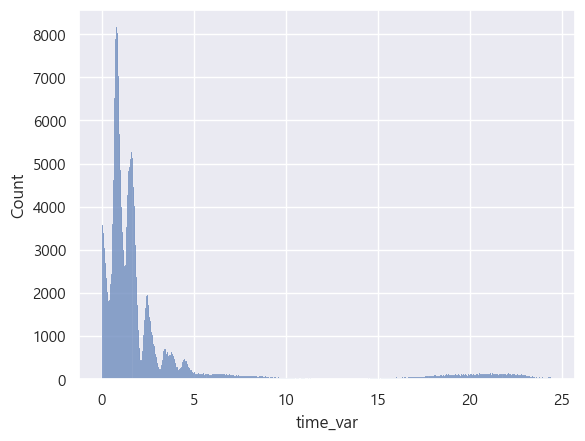

In [128]:
sns.histplot(train[(train['Delay'] == 'Not_Delayed')], x='time_var')
plt.show()

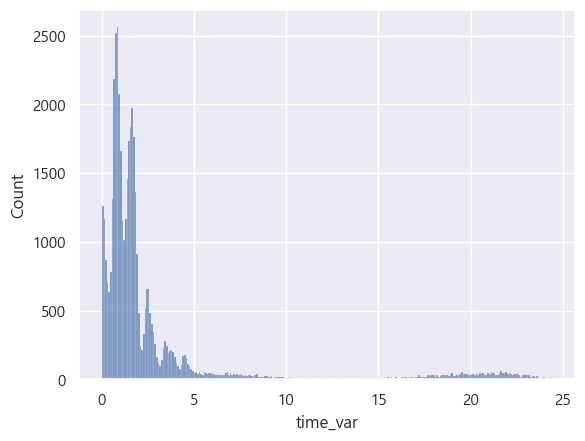

In [129]:
sns.histplot(train[(train['Delay'] == 'Delayed')], x='time_var')
plt.show()

# Model 학습 및 평가 (nan이 아닌 데이터에 대해)

In [130]:
train2 = train[train['Delay'].notna()]

In [131]:
train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 255001 entries, 5 to 999992
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     255001 non-null  int64  
 1   Day_of_Month              255001 non-null  int64  
 2   Estimated_Departure_Time  255001 non-null  int32  
 3   Estimated_Arrival_Time    255001 non-null  int32  
 4   Origin_Airport            255001 non-null  object 
 5   Origin_Airport_ID         255001 non-null  int64  
 6   Origin_State              255001 non-null  object 
 7   Destination_Airport       255001 non-null  object 
 8   Destination_Airport_ID    255001 non-null  int64  
 9   Destination_State         255001 non-null  object 
 10  Distance                  255001 non-null  float64
 11  Airline                   255001 non-null  object 
 12  Carrier_Code(IATA)        255001 non-null  object 
 13  Carrier_ID(DOT)           255001 non-null  i

In [133]:
train.columns

Index(['Month', 'Day_of_Month', 'Estimated_Departure_Time',
       'Estimated_Arrival_Time', 'Origin_Airport', 'Origin_Airport_ID',
       'Origin_State', 'Destination_Airport', 'Destination_Airport_ID',
       'Destination_State', 'Distance', 'Airline', 'Carrier_Code(IATA)',
       'Carrier_ID(DOT)', 'Tail_Number', 'Delay', 'Departure_Hour',
       'Departure_Min', 'Arrival_Hour', 'Arrival_Min', 'Elapsed_Time',
       'Elapsed_Hour', 'Elapsed_Min', 'Elapsed_Time_H', 'Pred_Time',
       'time_var'],
      dtype='object')

In [136]:
col_list = ['Month', 'Day_of_Month', 'Estimated_Departure_Time','Estimated_Arrival_Time', 'Origin_Airport', 'Destination_Airport', 'Distance', 'Airline', 'Tail_Number', 'Departure_Hour','Departure_Min', 'Arrival_Hour', 'Arrival_Min', 'Elapsed_Time_H', 'Pred_Time', 'time_var']

In [157]:
train_X = train[train['Delay'].notna()][col_list]
test_X = test[col_list]

In [ ]:
oh_col = ['Origin_Airport','Destination_Airport','Airline','Tail_Number']

for ohc in oh_col:
    oh = LabelEncoder()
    oh.fit(train_X[ohc])
    oh_data = oh.transform(train_X[ohc])
    train_X[ohc] = oh_data
    for label in np.unique(test_X[ohc]):
        if label not in oh.classes_: # unseen label 데이터인 경우( )
            oh.classes_ = np.append(oh.classes_, label) # 미처리 시 ValueError발생
    oh_data = oh.transform(test_X[ohc])
    test_X[ohc] = oh_data

In [148]:
train_y = train[train['Delay'].notna()]['Delay']

oh = LabelEncoder()
train_y = oh.fit_transform(train_y)  # delay되지 않을 확률

In [159]:
train_X.shape

(255001, 16)

In [165]:
from pycaret.classification import *

temp = train_X.copy() 
temp['Delay'] = train_y

s = setup(temp, target = 'Delay', silent=True, profile=True) #, feature_selection = True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [166]:
best_model_list = compare_models(sort='acc', n_select = 2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8235,0.6611,0.9994,0.8238,0.9031,0.0060,0.0409,0.9120
lr,Logistic Regression,0.8232,0.5905,1.0000,0.8232,0.9031,-0.0000,-0.0003,8.0970
ridge,Ridge Classifier,0.8232,0.0000,1.0000,0.8232,0.9031,0.0000,0.0000,0.1000
ada,Ada Boost Classifier,0.8232,0.6291,1.0000,0.8232,0.9031,0.0000,0.0000,3.9440
gbc,Gradient Boosting Classifier,0.8232,0.6459,1.0000,0.8232,0.9031,0.0000,0.0000,17.2060
lda,Linear Discriminant Analysis,0.8232,0.6157,1.0000,0.8232,0.9031,0.0000,0.0000,0.3640
dummy,Dummy Classifier,0.8232,0.5000,1.0000,0.8232,0.9031,0.0000,0.0000,0.0500
xgboost,Extreme Gradient Boosting,0.8227,0.6558,0.9948,0.8256,0.9023,0.0253,0.0674,10.9750
rf,Random Forest Classifier,0.8190,0.6239,0.9901,0.8250,0.9001,0.0192,0.0427,15.5640
et,Extra Trees Classifier,0.8155,0.6179,0.9840,0.8254,0.8977,0.0224,0.0411,10.5380


## RandomForestClassifier
* 0.815483073649844

In [182]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, KFold

In [183]:
model = RandomForestClassifier(random_state=11)
# model.fit(train_X, train_y)
kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X, train_y, scoring='accuracy', cv=kf)

NameError: name 'socre_list' is not defined

In [184]:
print(np.mean(score_list))

0.815483073649844


In [174]:
# pred = model.predict(test_X)
pred = model.predict_proba(test_X)

In [175]:
pred

array([[0.35, 0.65],
       [0.66, 0.34],
       [0.49, 0.51],
       ...,
       [0.2 , 0.8 ],
       [0.25, 0.75],
       [0.11, 0.89]])

In [176]:
result = pd.read_csv('./datasets/sample_submission.csv')
# result['Not_Delayed'] = pred
# result['Delayed'] = 1-pred
result[['Not_Delayed', 'Delayed']] = pred
result.to_csv('./submit_v2.csv', index=False)

## LGBMClassifier
* 0.8238006867224057
* 0.8238202947193269

In [187]:
from lightgbm import LGBMClassifier

model = LGBMClassifier(random_state=12)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.8238006867224057


In [ ]:
model.fit(train_X, train_y)
pred = model.predict_proba(test_X)
result = pd.read_csv('./datasets/sample_submission.csv')
result[['Not_Delayed', 'Delayed']] = pred
result.to_csv('./submit_v3.csv', index=False)

In [193]:
train_X2 = train_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time'], axis=1)
test_X2 = test_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time'], axis=1)

In [200]:
model = LGBMClassifier(random_state=11)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X2, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.8238202947193269


In [201]:
model.fit(train_X2, train_y)
pred = model.predict_proba(test_X2)
result = pd.read_csv('./datasets/sample_submission.csv')
result[['Not_Delayed', 'Delayed']] = pred
result.to_csv('./submit_v4.csv', index=False)

In [202]:
train_X2 = train_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time','Pred_Time'], axis=1)
test_X2 = test_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time','Pred_Time'], axis=1)

In [203]:
model = LGBMClassifier(random_state=11)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X2, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.8238202947193269


## LogisticRegression
* 0.8235222568108045

In [189]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=11)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.8235222568108045


In [197]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=11)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X2, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.8234908842617849


## VotingClassification

In [198]:
from sklearn.ensemble import VotingClassifier

model = VotingClassifier([("logistic", LogisticRegression(random_state=0)), ("LGBM", LGBMClassifier(random_state=11))])

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X2, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.8237810790330524


# Train Nan Data Model

In [219]:
col_list = ['Month', 'Day_of_Month', 'Estimated_Departure_Time','Estimated_Arrival_Time', 'Origin_Airport', 'Destination_Airport', 'Distance', 'Airline', 'Tail_Number', 'Departure_Hour','Departure_Min', 'Arrival_Hour', 'Arrival_Min', 'Elapsed_Time_H', 'Pred_Time', 'time_var']

In [220]:
train_X_non = train[train['Delay'].isna()][col_list]

In [221]:
oh_col = ['Origin_Airport','Destination_Airport','Airline','Tail_Number']

for ohc in oh_col:
    oh = LabelEncoder()
    oh.fit(train_X_non[ohc])
    oh_data = oh.transform(train_X_non[ohc])
    train_X_non[ohc] = oh_data


In [222]:
train_X2 = train_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time', 'Pred_Time'], axis=1)
train_X_non = train_X_non.drop(['Estimated_Departure_Time','Estimated_Arrival_Time', 'Pred_Time'], axis=1)

In [213]:
train_X2.columns

Index(['Month', 'Day_of_Month', 'Origin_Airport', 'Destination_Airport',
       'Distance', 'Airline', 'Tail_Number', 'Departure_Hour', 'Departure_Min',
       'Arrival_Hour', 'Arrival_Min', 'Elapsed_Time_H', 'time_var'],
      dtype='object')

In [214]:
train_X_non.columns

Index(['Month', 'Day_of_Month', 'Origin_Airport', 'Destination_Airport',
       'Distance', 'Airline', 'Tail_Number', 'Departure_Hour', 'Departure_Min',
       'Arrival_Hour', 'Arrival_Min', 'Elapsed_Time_H', 'time_var'],
      dtype='object')

In [223]:
model = LGBMClassifier(random_state=11)
model.fit(train_X2, train_y)
pred = model.predict(train_X_non)

In [224]:
nanidx = train[train['Delay'].isna()].index

In [225]:
train.loc[nanidx, 'Delay'] = pred

In [226]:
train_X = train[col_list]
train_y = train['Delay']
test_X = test[col_list]

train_X = train_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time', 'Pred_Time'], axis=1)
test_X = test_X.drop(['Estimated_Departure_Time','Estimated_Arrival_Time', 'Pred_Time'], axis=1)

oh_col = ['Origin_Airport','Destination_Airport','Airline','Tail_Number']

for ohc in oh_col:
    oh = LabelEncoder()
    oh.fit(train_X[ohc])
    oh_data = oh.transform(train_X[ohc])
    train_X[ohc] = oh_data
    for label in np.unique(test_X[ohc]):
        if label not in oh.classes_: # unseen label 데이터인 경우( )
            oh.classes_ = np.append(oh.classes_, label) # 미처리 시 ValueError발생
    oh_data = oh.transform(test_X[ohc])
    test_X[ohc] = oh_data

In [237]:
train_y.value_counts()

1    954477
0     45523
Name: Delay, dtype: int64

In [236]:
train_y = train_y.replace(['Not_Delayed','Delayed'],[1, 0])

In [238]:
train_y.info()

<class 'pandas.core.series.Series'>
RangeIndex: 1000000 entries, 0 to 999999
Series name: Delay
Non-Null Count    Dtype
--------------    -----
1000000 non-null  int64
dtypes: int64(1)
memory usage: 7.6 MB


In [239]:
model = LGBMClassifier(random_state=11)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.9545959999999999


In [240]:
model.fit(train_X, train_y)
pred = model.predict_proba(test_X)
result = pd.read_csv('./datasets/sample_submission.csv')
result[['Not_Delayed', 'Delayed']] = pred
result.to_csv('./submit_v5.csv', index=False)

In [ ]:
# 0.8238202947193269

In [241]:
train_X = train_X.drop(nanidx, axis=0)
train_y = train_y.drop(nanidx, axis=0)

In [ ]:
model = LGBMClassifier(random_state=12)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

0.823890883031513


In [244]:
model.fit(train_X, train_y)
pred = model.predict_proba(test_X)
result = pd.read_csv('./datasets/sample_submission.csv')
result[['Not_Delayed', 'Delayed']] = pred
result.to_csv('./submit_v6.csv', index=False)

In [ ]:
from sklearn.semi_supervised import SelfTrainingClassifier

In [245]:
train.loc[nanidx, 'Delay'] = np.nan

In [247]:
col_list = ['Month', 'Day_of_Month', 'Origin_Airport', 'Destination_Airport', 'Distance', 'Airline', 'Tail_Number', 'Departure_Hour','Departure_Min', 'Arrival_Hour', 'Arrival_Min', 'Elapsed_Time_H',  'time_var']

In [249]:
train_X = train[col_list]
train_y = train['Delay']
test_X = test[col_list]

train_y = train_y.replace(['Not_Delayed','Delayed'],[1, 0])

oh_col = ['Origin_Airport','Destination_Airport','Airline','Tail_Number']

for ohc in oh_col:
    oh = LabelEncoder()
    oh.fit(train_X[ohc])
    oh_data = oh.transform(train_X[ohc])
    train_X[ohc] = oh_data
    for label in np.unique(test_X[ohc]):
        if label not in oh.classes_: # unseen label 데이터인 경우( )
            oh.classes_ = np.append(oh.classes_, label) # 미처리 시 ValueError발생
    oh_data = oh.transform(test_X[ohc])
    test_X[ohc] = oh_data

In [259]:
train_y = train_y.fillna(-1)
train_y.info()

<class 'pandas.core.series.Series'>
RangeIndex: 1000000 entries, 0 to 999999
Series name: Delay
Non-Null Count    Dtype  
--------------    -----  
1000000 non-null  float64
dtypes: float64(1)
memory usage: 7.6 MB


In [260]:
from sklearn.semi_supervised import LabelPropagation

In [261]:
clf = LabelPropagation(kernel='knn', n_neighbors=5, max_iter=1000)
clf.fit(train_X, train_y)
predicted_labels = clf.predict(train_X)

In [264]:
pd.Series(predicted_labels).value_counts()

0.0    835188
1.0    164812
dtype: int64

In [250]:
from sklearn.semi_supervised.sel import SelfTrainingClassifier

lgbm = LGBMClassifier(random_state=11)
model = SelfTrainingClassifier(lgbm)

kf = KFold(n_splits=5, shuffle=True, random_state=11)
score_list = cross_val_score(model, train_X, train_y, scoring='accuracy', cv=kf)
print(np.mean(score_list))

ImportError: cannot import name 'SelfTrainingClassifier' from 'sklearn.semi_supervised' (C:\AI\pythonProject\venv\lib\site-packages\sklearn\semi_supervised\__init__.py)

In [257]:
import sklearn; sklearn.show_versions()


System:
    python: 3.8.8 (tags/v3.8.8:024d805, Feb 19 2021, 13:18:16) [MSC v.1928 64 bit (AMD64)]
executable: C:\AI\pythonProject\venv\Scripts\python.exe
   machine: Windows-10-10.0.19041-SP0

Python dependencies:
          pip: 23.0.1
   setuptools: 65.5.1
      sklearn: 0.23.2
        numpy: 1.20.3
        scipy: 1.5.4
       Cython: 0.29.14
       pandas: 1.5.3
   matplotlib: 3.6.3
       joblib: 1.2.0
threadpoolctl: 3.1.0

Built with OpenMP: True
